In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from itertools import cycle
color_cycle = cycle(plt.rcParams['axes.prop_cycle'].by_key()['color'])

import cv2

import time
import os
from pathlib import Path
import glob
from tqdm.notebook import tqdm, tnrange
import gc

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision.transforms as T
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torch.utils.data import random_split

# from fastai.vision.all import *
from modules.dataset import *
from modules.lovasz_loss import *
from modules.metrics import *
from modules.utils import *

import wandb
from fastai.callback.wandb import *
import segmentation_models_pytorch as smp

from albumentations import *
from albumentations.pytorch import ToTensorV2

In [2]:
class main_metrics(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super().__init__()

    def forward(self, preds, mask):
        
        preds = torch.sigmoid(preds)
        preds = (preds > 0.5).float()

        N = len(preds)
        p = preds.reshape(N,-1)
        t = mask.reshape(N,-1)
        t = t>0.5
        
        uion = p.sum(-1) + t.sum(-1)
        overlap = (p*t).sum(-1)
        dice = 2*overlap/(uion+0.0001)

        tp = (p*t).sum(-1)
        tp_sum_fn = t.sum(-1)
        recall = tp/(tp_sum_fn + 0.0001)

        tp_sum_fp = p.sum(-1)
        precision = tp/(tp_sum_fp + 0.0001)
    
        return dice.mean().item(), precision.mean().item(), recall.mean().item()        

In [3]:
# %load_ext autoreload
# %autoreload 2

In [4]:
cfg_name = 'train_cfg.yml'
with open(f'cfg/{cfg_name}') as f:
        # use safe_load instead load
        cfg = yaml.safe_load(f)

bs = cfg['bs']
nfolds = cfg['nfolds']
fold = cfg['fold']
SEED = cfg['SEED']
TRAIN = cfg['TRAIN']
MASKS = cfg['MASKS']
LABELS = cfg['LABELS']
EXPERIMENT_NAME = cfg['EXPERIMENT_NAME']
NUM_WORKERS = cfg['NUM_WORKERS']
EPOCHS = cfg['EPOCHS']
DEVICE = cfg['DEVICE']
save_root = f'../experiments/{EXPERIMENT_NAME}'

In [5]:
def evaluate_model(model, val_loader, loss, metric, save_preds=False, at_original_scale=False, multiclass=False):
    model.eval()
    model.output_type = ['loss']

    total_dice, total_precision, total_recall = 0, 0, 0
    with torch.no_grad():
        valid_loss = 0
        val_score = 0
        for i, data in enumerate(val_loader):
            img, mask = data
            img = img.to(DEVICE)
            if multiclass:
                mask = mask.squeeze(1).long().to(DEVICE)           
            else:
                mask = mask.to(DEVICE)
            outputs = model({'image':img, 'mask':mask})
            
            if save_preds:
                save_predictions_as_imgs(outputs['raw'], mask, folder=f"{save_root}", idx=i)
            
            if at_original_scale:
                output_upscaled = F.interpolate(outputs['raw'], size=(mask.shape[2], mask.shape[3]),
                                          mode='bilinear',align_corners=False, antialias=True)
                val_score += metric(output_upscaled, mask).item()
                valid_loss += loss(output_upscaled, mask)
            else:
                val_dice, val_precision, val_recall = metric(outputs['raw'], mask)
                valid_loss += outputs['bce_loss'].mean()

            total_dice += val_dice
            total_precision += val_precision
            total_recall += val_recall

            
        valid_loss /= len(val_loader)
        mean_dice = total_dice / len(val_loader)
        precision = total_precision / len(val_loader)
        recall = total_recall / len(val_loader)

        return valid_loss, mean_dice, precision, recall

In [6]:
df = pd.read_csv(LABELS)
data_source =['Hubmap', 'HPA']
# data_source =['Hubmap']

organ_threshold = {
    'Hubmap': {
        'kidney'        : 0.40,
        'prostate'      : 0.40,
        'largeintestine': 0.40,
        'spleen'        : 0.40,
        'lung'          : 0.10,
    },
    'HPA': {
        'kidney'        : 0.50,
        'prostate'      : 0.50,
        'largeintestine': 0.50,
        'spleen'        : 0.50,
        'lung'          : 0.10,
    },
}


kf = StratifiedKFold(n_splits=nfolds, random_state=SEED, shuffle=True) 
train, val = list(kf.split(df, df['organ']))[fold]

sub_df = df.iloc[val]
print(df.iloc[train].shape)
print(sub_df.shape)

(263, 10)
(88, 10)


In [7]:
# save_root = '../experiments/covatt(staug_element)_stinv_0.5_enc2_maxpool_out3x3_resnet50_unet_aug_a1/' #

In [8]:
checkpoint_epochs = np.arange(60, 80)
# checkpoint_epochs = np.arange(20, 40)
checkpoint = [f'{save_root}/epoch_{e}.pth' for e in checkpoint_epochs]
swa_state_dict = do_swa(checkpoint)
torch.save(swa_state_dict, f'{save_root}/swa_last20.pth')

FileNotFoundError: [Errno 2] No such file or directory: '../experiments/covatt(staug_element)_stinv_0.5_enc1_seqconv_out6x6_resnet50_unet_aug_a1_3rd_run/epoch_61.pth'

In [ ]:
for file in checkpoint[1:-1]:
    os.remove(file)

In [9]:
# from modules.models.pvtv2_smp_unet import *
# from modules.models.model_daformer_coat import *
# from modules.models.efnet_smp_unet_he import *
from modules.models.resnet_smp_unet_he import *
# from modules.models.mobilenet_smp_unet_he import *
# from modules.models.convnext_smp_unet_he import *

# Loss, Metric
loss_func = nn.BCEWithLogitsLoss() #F.binary_cross_entropy_with_logits(logit,batch['mask']) # CustomLoss()
metric = main_metrics()

# Model, optim, sch
model = Net(stinv_training=False, stinv_enc_dim=0, pool_out_size=6, n_domains=6).cuda()

# model = Net().cuda()

checkpoint = 79 # 0

#model.load_state_dict(torch.load(f"{save_root}/fold_{fold}_epoch_{checkpoint}.pth"))
# state_dict = f'{save_root}/swa_{"_".join([str(i) for i in checkpoint_epochs])}.pth'
# state_dict = f'{save_root}/swa_last20.pth' 
state_dict = f"{save_root}/epoch_{checkpoint}.pth"  
model.load_state_dict(torch.load(state_dict), strict=False)

_IncompatibleKeys(missing_keys=[], unexpected_keys=['downsample.0.weight', 'downsample.1.weight', 'downsample.1.bias', 'downsample.1.running_mean', 'downsample.1.running_var', 'downsample.1.num_batches_tracked', 'downsample.3.weight', 'downsample.4.weight', 'downsample.4.bias', 'downsample.4.running_mean', 'downsample.4.running_var', 'downsample.4.num_batches_tracked', 'downsample.6.weight', 'cov_attention.fc.weight', 'cov_attention.fc.bias', 'ca.ca.fc.0.weight', 'ca.ca.fc.2.weight', 'stain_predictor.domain_embedding.weight', 'stain_predictor.domain_embedding.bias', 'stain_predictor.linear.weight', 'stain_predictor.linear.bias', 'stain_predictor.bn.weight', 'stain_predictor.bn.bias', 'stain_predictor.bn.running_mean', 'stain_predictor.bn.running_var', 'stain_predictor.bn.num_batches_tracked'])

In [ ]:
from modules.augs import *

def test_time_stnorm(stain=None):

    if stain == 'he':
        normalizer = he_normalizer
    elif stain == 'pas':
        normalizer = pas_normalizer
    elif stain == 'tri':
        normalizer = tri_normalizer
    else:
        normalizer = None

    return Compose([
        stain_norm_as_aug(normalizer, T, 1)
    ], p=1)

In [ ]:
test_stains = [None, 'he', 'pas', 'tri']
for test_time_stain in test_stains:
    multiclass = False
    test_time_p = 0
    organs = ['kidney', 'prostate', 'largeintestine', 'spleen', 'lung']
    # organs = ['lung']
    print(f'Fold: {fold}')
    print(f'Model: {state_dict}')
    log = open(f'{save_root}/val_res.txt', 'a')
    log.write(f'Fold: {fold}' + '\n')
    log.write(f'Model: {state_dict}' + '\n')

    notes = f'hpa_hubmap_2022 ({test_time_stain})'
    log.write(notes + '\n')

    val_data = hpa_hubmap_data(fold=fold, train=False, tfms=test_time_stnorm(stain = test_time_stain))
    val_loader = DataLoader(val_data, shuffle = True, batch_size = bs, num_workers=8)   
    loss, dice, precision, recall = evaluate_model(model, val_loader, loss_func, metric, at_original_scale=False)
    res = f'Organ: all | Loss: {loss.item():.3f} | Dice: {dice:.3f} | Precision: {precision:.3f} | Recall: {recall:.3f})'
    log.write(res + '\n')
    print(notes)
    print(res)

    for organ in organs: 
        mask = (sub_df['organ'] == organ)
        val_ids = sub_df[mask].id.astype(str).values
        val_data = hpa_hubmap_data_val(fold=fold, ids=val_ids, train=False, tfms=test_time_stnorm(stain = test_time_stain))
        val_loader = DataLoader(val_data, shuffle = True, batch_size = bs, num_workers=8)   
        loss, dice, precision, recall = evaluate_model(model, val_loader, loss_func, metric, at_original_scale=False)
        res = f'Organ: {organ} | Loss: {loss.item():.3f} | Dice: {dice:.3f} | Precision: {precision:.3f} | Recall: {recall:.3f})'
        log.write(res + '\n')
        print(res)

    log.write('\n')
    log.close()

Fold: 2
Model: ../experiments/covatt(staug_element)_stinv_0.5_enc5_maxpool_out1x1_resnet50_unet_aug_a1_3rd_run/epoch_79.pth
hpa_hubmap_2022 (None)
Organ: all | Loss: 0.156 | Dice: 0.667 | Precision: 0.717 | Recall: 0.671)
Organ: kidney | Loss: 0.087 | Dice: 0.869 | Precision: 0.924 | Recall: 0.856)
Organ: prostate | Loss: 0.182 | Dice: 0.802 | Precision: 0.803 | Recall: 0.847)
Organ: largeintestine | Loss: 0.165 | Dice: 0.879 | Precision: 0.871 | Recall: 0.898)
Organ: spleen | Loss: 0.224 | Dice: 0.451 | Precision: 0.657 | Recall: 0.363)
Organ: lung | Loss: 0.138 | Dice: 0.014 | Precision: 0.081 | Recall: 0.025)
Fold: 2
Model: ../experiments/covatt(staug_element)_stinv_0.5_enc5_maxpool_out1x1_resnet50_unet_aug_a1_3rd_run/epoch_79.pth
hpa_hubmap_2022 (he)
Organ: all | Loss: 0.180 | Dice: 0.568 | Precision: 0.669 | Recall: 0.565)
Organ: kidney | Loss: 0.107 | Dice: 0.717 | Precision: 0.816 | Recall: 0.716)
Organ: prostate | Loss: 0.233 | Dice: 0.665 | Precision: 0.756 | Recall: 0.672)
Or

In [10]:
neptune_root = '../data/NEPTUNE/'
nept_he = 'HE_glom_capsule/'
nept_pas = 'pas-gcapsule-data'
nept_sil = 'sil-gcapsule-data'
nept_tri = 'tri-gcapsule-data'

In [ ]:
# ds = neptune_data(os.path.join(neptune_root, nept_he), full_val=True, img_size=768)
# dl = DataLoader(ds, batch_size=2, shuffle=False, num_workers=2)
# imgs, masks = next(iter(dl))

# plt.figure(figsize=(16, 16))
# for i,(img,mask) in enumerate(zip(imgs,masks)):
#     img = ((img.permute(1,2,0))*255.0).numpy().astype(np.uint8)
#     plt.subplot(2, 4, i+1)
#     plt.imshow(img,vmin=0,vmax=255)
#     plt.imshow(mask.squeeze().numpy(), alpha=0.4, cmap='gray')
#     plt.axis('off')
#     plt.subplots_adjust(wspace=None, hspace=0.1)
    
# plt.tight_layout()

# del ds,dl,imgs,masks

In [11]:
print(f'Model: {state_dict}')
for stain_path in [nept_he, nept_pas, nept_tri, nept_sil]:
    neptune_path = os.path.join(neptune_root, stain_path)
    img_size = 480

    log = open(f'{save_root}/val_res.txt', 'a')
    log.write(f'Model: {state_dict}' + '\n')

    notes = f'{neptune_path} img_size: {img_size}'
    log.write(notes + '\n')

    val_data = neptune_data(neptune_path, full_val=True, img_size=img_size)
    val_loader = DataLoader(val_data, shuffle = True, batch_size = bs, num_workers=8)
    val_loader = DataLoader(val_data, shuffle = True, batch_size = bs, num_workers=8)   
    loss, dice, precision, recall = evaluate_model(model, val_loader, loss_func, metric, at_original_scale=False)

    res = f'Loss: {loss.item()} | Dice: {dice:.3f} | Precision: {precision:.3f} | Recall: {recall:.3f})'
    log.write(res + '\n')
    print(res)

    log.write('\n')
    log.close()

Model: ../experiments/covatt(staug_element)_stinv_0.5_enc1_seqconv_out6x6_resnet50_unet_aug_a1_3rd_run/epoch_79.pth
Loss: -56.828330993652344 | Dice: 0.626 | Precision: 0.644 | Recall: 0.708)
Loss: -63.834129333496094 | Dice: 0.663 | Precision: 0.606 | Recall: 0.824)
Loss: -97.36962127685547 | Dice: 0.471 | Precision: 0.391 | Recall: 0.793)
Loss: -45.56403350830078 | Dice: 0.469 | Precision: 0.405 | Recall: 0.681)


In [12]:
hubmap21_kidney_imgs = '../data/Hubmap_21_Kidney/train/'
hubmap21_kidney_masks = '../data/Hubmap_21_Kidney/masks/'

img_size = 224

print(f'Model: {state_dict}')
log = open(f'{save_root}/val_res.txt', 'a')
log.write(f'Model: {state_dict}' + '\n')

notes = f'hubmap_21_kidney img_size: {img_size}'
log.write(notes + '\n')

val_data = hubmap21_kidney_data(hubmap21_kidney_imgs, hubmap21_kidney_masks, full_val=True, img_size=img_size)
val_loader = DataLoader(val_data, shuffle = True, batch_size = bs, num_workers=8)   
loss, dice, precision, recall = evaluate_model(model, val_loader, loss_func, metric, at_original_scale=False)
res = f'Loss: {loss.item()} | Dice: {dice:.3f} | Precision: {precision:.3f} | Recall: {recall:.3f})'
log.write(res + '\n')
print(res)

log.write('\n')
log.close()

Model: ../experiments/covatt(staug_element)_stinv_0.5_enc1_seqconv_out6x6_resnet50_unet_aug_a1_3rd_run/epoch_79.pth
Loss: 0.8389394879341125 | Dice: 0.301 | Precision: 0.250 | Recall: 0.711)


In [13]:
aidpath_imgs = '../data/Aidpath_processed/images_1024/'
aidpath_masks = '../data/Aidpath_processed/masks_1024/'

img_size = 256

print(f'Model: {state_dict}')
log = open(f'{save_root}/val_res.txt', 'a')
log.write(f'Model: {state_dict}' + '\n')

notes = f'adipath img_size: {img_size}'
log.write(notes + '\n')

val_data = aidpath_data(aidpath_imgs, aidpath_masks, full_val=True, img_size=img_size)
val_loader = DataLoader(val_data, shuffle = True, batch_size = bs, num_workers=8)   
loss, dice, precision, recall = evaluate_model(model, val_loader, loss_func, metric, at_original_scale=False)
res = f'Loss: {loss.item()} | Dice: {dice:.3f} | Precision: {precision:.3f} | Recall: {recall:.3f})'
log.write(res + '\n')
print(res)

log.write('\n')
log.close()

Model: ../experiments/covatt(staug_element)_stinv_0.5_enc1_seqconv_out6x6_resnet50_unet_aug_a1_3rd_run/epoch_79.pth
Loss: 0.23827245831489563 | Dice: 0.482 | Precision: 0.520 | Recall: 0.535)


In [ ]:
import numpy as np
pixel_size = 0.65 
img_size = 768 # used during training for hpa
H, W = 512, 512 # of input img e.g. neptune

s = pixel_size/0.4 * (img_size/3000)
h = int(np.ceil(int(H*s)/32)*32)
w = int(np.ceil(int(W*s)/32)*32)
print(h, w) 

224 224


In [ ]:
print(f'cp {save_root}/fold_{fold}_swa_{"_".join([str(i) for i in checkpoint_epochs])}.pth experiments/upload/')
print(f'kaggle datasets version -p experiments/upload -m "{EXPERIMENT_NAME}"')

NameError: name 'checkpoint_epochs' is not defined

In [ ]:
cp experiments/pvtv2_b4_unet_aug_a2_stinv_1024_cr_more_reg/fold_2/fold_2_swa_180_250_200_299.pth experiments/upload/

### Viz preds on test img

In [ ]:
import os
from modules.stainspec.randstainNA.randstainna import RandStainNA 
import cv2 
from skimage import io
import matplotlib.pyplot as plt 

# Usage1: Demo(for visualization)
# Setting: is_train = False
randstainna = RandStainNA(
    yaml_file = 'modules/stainspec/randstainNA/HPA.yaml',
    std_hyper = -0.3, 
    distribution = 'normal', 
    probability = 1.0,
    is_train = True 
)

In [ ]:
img = cv2.cvtColor(cv2.imread('../data/hubmap_orig/test_images/10078.tiff'), cv2.COLOR_BGR2RGB)
img_norm = cv2.cvtColor(cv2.imread('../data/hubmap_orig/test_images/10078_hpa_norm.tiff'), cv2.COLOR_BGR2RGB)

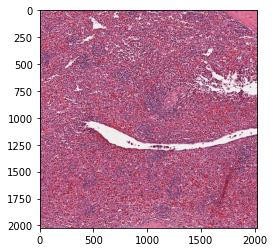

In [ ]:
plt.imshow(img)

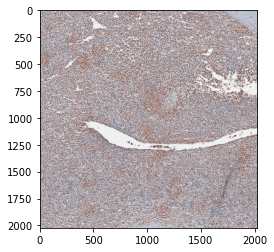

In [ ]:
plt.imshow(img_norm)

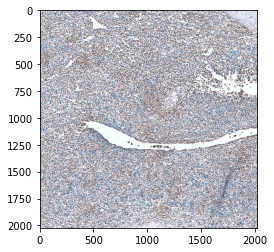

In [ ]:
aug_img = randstainna(img, force_apply=None, mask=None)
plt.imshow(aug_img['image'])

In [ ]:
img.shape, \
img.dtype

((2023, 2023, 3), dtype('uint8'))

In [ ]:
aug_img['image'].shape, \
aug_img['image'].dtype

((2023, 2023, 3), dtype('uint8'))

In [ ]:
tiff = transformed_img.numpy() #aug_img['image']
tiff = tiff.astype(np.float32)/255
H,W,_ = tiff.shape

#or just resize to h,w = 768
img_size = 768
image = cv2.resize(tiff,dsize=(img_size, img_size),interpolation=cv2.INTER_LINEAR)

image = img2tensor(image).cuda() #img2tensor(image)
batch = {'image':image}

model.eval()
model.output_type = ['inference', 'stain_info']

use = 0
probability = 0
with torch.no_grad():
    with torch.cuda.amp.autocast(enabled = True):
        use += 1
        output = model(batch)
        probability += \
            F.interpolate(output['probability'], size=(img.shape[0], img.shape[1]),
                            mode='bilinear',align_corners=False, antialias=True )

#---
probability = probability.data.cpu().numpy()
p = probability > 0.5 

In [ ]:
output.keys()

dict_keys(['raw', 'probability', 'stain_info'])

In [ ]:
from torchvision import transforms

T = transforms.Compose([
    transforms.ToTensor(),
    transforms.Lambda(lambda x: x*255)
])

normalizer = TorchMacenkoNormalizer()

In [ ]:
HE_target, c_target, maxC_target = normalizer.get_he_matrix(T(img))

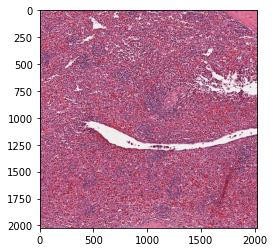

In [ ]:
plt.imshow(img)

In [ ]:
HE_target

tensor([[0.4643, 0.1182],
        [0.7584, 0.8074],
        [0.4575, 0.5781]])

In [ ]:
output['stain_info'].detach().cpu().double().view(3, 2)

tensor([[0.3652, 0.1647],
        [0.7734, 0.8301],
        [0.4993, 0.5400]], dtype=torch.float64)

In [ ]:
output['stain_info']

tensor([[0.3977, 0.1854, 0.8179, 0.9023, 0.5420, 0.5981]], device='cuda:0',
       dtype=torch.float16)

In [ ]:
output['stain_info'].detach().cpu().double().view(3, 2)

tensor([[0.3977, 0.1854],
        [0.8179, 0.9023],
        [0.5420, 0.5981]], dtype=torch.float64)

In [ ]:
transformed_img, _, _ = normalizer.normalize(T(img), maxC_target, output['stain_info'].detach().cpu().view(3, 2).float() , stains=False)

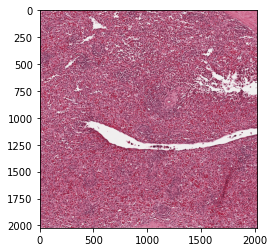

In [ ]:
plt.imshow(transformed_img)

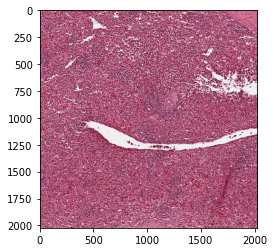

In [ ]:
plt.imshow(transformed_img)

In [ ]:
he_matrices = HE_target.flatten()

In [ ]:
he_matrices

tensor([0.4643, 0.1182, 0.7584, 0.8074, 0.4575, 0.5781])

In [ ]:
mse_loss = nn.MSELoss()
def rmse_loss(out, target):
    return torch.sqrt(mse_loss(out, target))

In [ ]:
loss_stinv = rmse_loss(output['stain_info'], he_matrices.cuda())

In [ ]:
loss_stinv

tensor(0.0508, device='cuda:0')

In [ ]:
model.train()

optimizer = torch.optim.AdamW(model.parameters(), lr=5e-5, weight_decay=1e-3)
scaler = torch.cuda.amp.GradScaler()

optimizer.zero_grad()
loss_stinv = rmse_loss(output['stain_info'], he_matrices.cuda())


In [ ]:
loss.requires_grad_(True)

tensor(0.0696, device='cuda:0', requires_grad=True)

In [ ]:
loss.requires_grad

True

In [ ]:
loss = loss_stinv
loss.backward()
optimizer.step()

In [ ]:
scaler.unscale_(optimizer)
scaler.step(optimizer)
scaler.update()

In [ ]:
model.eval()

In [ ]:
probability[probability < 0.5] = 0

In [ ]:
probability.shape

(1, 6, 2023, 2023)

In [ ]:
p = np.argmax(probability, axis = 1)

In [ ]:
p[p > 0] = 1

In [ ]:
p_norm = p.copy()

In [ ]:
m = img_norm
p = (probability[0][0] + p_norm[0][0]) / 2

plt.figure(figsize=(12, 7))
plt.subplot(1, 3, 1); plt.imshow(m); plt.axis('OFF'); plt.title('image')
plt.subplot(1, 3, 2); plt.imshow(p*255); plt.axis('OFF'); plt.title('mask')
plt.subplot(1, 3, 3); plt.imshow(m); plt.imshow(p*255, alpha=0.4); plt.axis('OFF'); plt.title('overlay')
plt.tight_layout()
plt.show()

NameError: name 'p_norm' is not defined

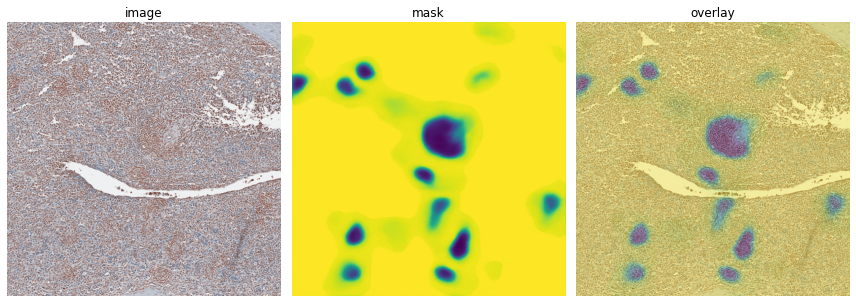

In [ ]:
m = img_norm
p = probability[0][0]

plt.figure(figsize=(12, 7))
plt.subplot(1, 3, 1); plt.imshow(m); plt.axis('OFF'); plt.title('image')
plt.subplot(1, 3, 2); plt.imshow(p*255); plt.axis('OFF'); plt.title('mask')
plt.subplot(1, 3, 3); plt.imshow(m); plt.imshow(p*255, alpha=0.4); plt.axis('OFF'); plt.title('overlay')
plt.tight_layout()
plt.show()

In [ ]:
probability.shape

(1, 6, 2023, 2023)

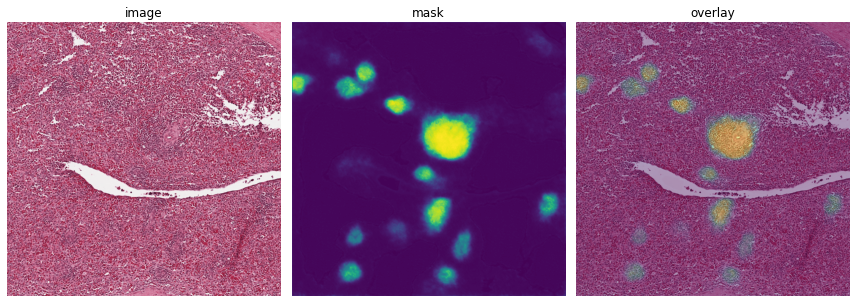

In [ ]:
# After opt step
m = transformed_img
p = probability[0][0]

plt.figure(figsize=(12, 7))
plt.subplot(1, 3, 1); plt.imshow(m); plt.axis('OFF'); plt.title('image')
plt.subplot(1, 3, 2); plt.imshow(p*255); plt.axis('OFF'); plt.title('mask')
plt.subplot(1, 3, 3); plt.imshow(m); plt.imshow(p*255, alpha=0.4); plt.axis('OFF'); plt.title('overlay')
plt.tight_layout()
plt.show()

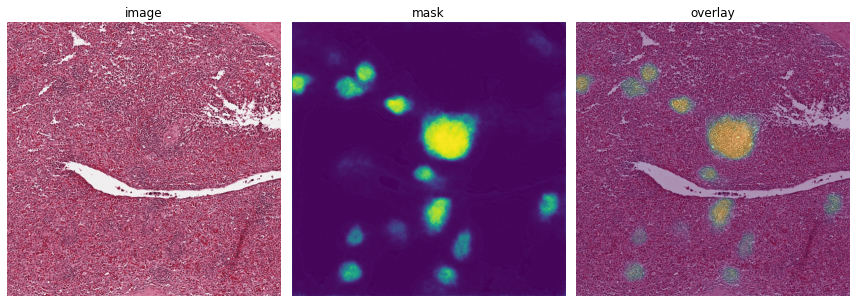

In [ ]:
m = transformed_img
p = probability[0][0]

plt.figure(figsize=(12, 7))
plt.subplot(1, 3, 1); plt.imshow(m); plt.axis('OFF'); plt.title('image')
plt.subplot(1, 3, 2); plt.imshow(p*255); plt.axis('OFF'); plt.title('mask')
plt.subplot(1, 3, 3); plt.imshow(m); plt.imshow(p*255, alpha=0.4); plt.axis('OFF'); plt.title('overlay')
plt.tight_layout()
plt.show()

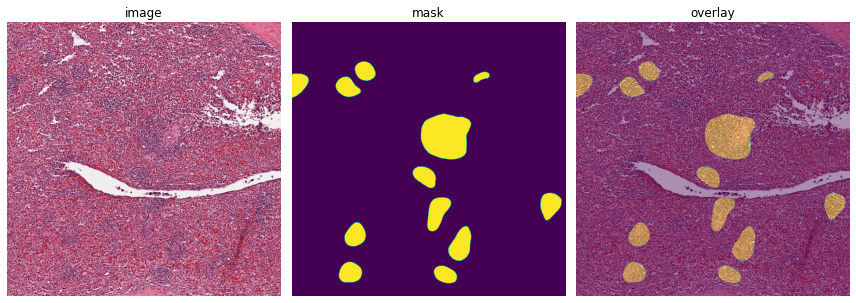

In [ ]:
m = img
p = p[0] #probability[0][4] > 0.5

plt.figure(figsize=(12, 7))
plt.subplot(1, 3, 1); plt.imshow(m); plt.axis('OFF'); plt.title('image')
plt.subplot(1, 3, 2); plt.imshow(p*255); plt.axis('OFF'); plt.title('mask')
plt.subplot(1, 3, 3); plt.imshow(m); plt.imshow(p*255, alpha=0.4); plt.axis('OFF'); plt.title('overlay')
plt.tight_layout()
plt.show()

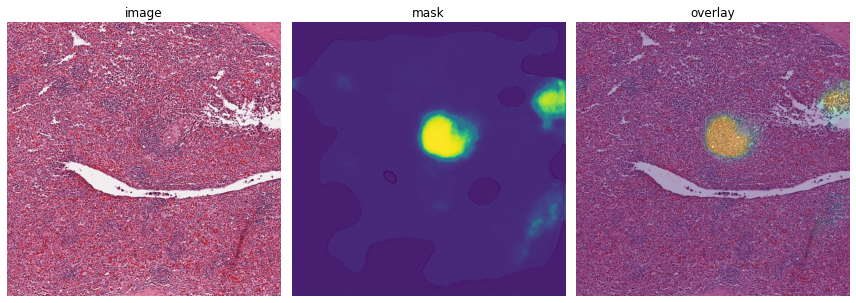

In [ ]:
m = img
p = probability[0][0]

plt.figure(figsize=(12, 7))
plt.subplot(1, 3, 1); plt.imshow(m); plt.axis('OFF'); plt.title('image')
plt.subplot(1, 3, 2); plt.imshow(p*255); plt.axis('OFF'); plt.title('mask')
plt.subplot(1, 3, 3); plt.imshow(m); plt.imshow(p*255, alpha=0.4); plt.axis('OFF'); plt.title('overlay')
plt.tight_layout()
plt.show()

### Cascade PSP

In [ ]:
refine.Refiner??

Init signature:
refine.Refiner(
    device='cpu',
    model_folder=None,
    download_and_check_model=True,
)
Docstring:      <no docstring>
Source:        
class Refiner:
    def __init__(self, device='cpu', model_folder=None, download_and_check_model=True):
        """
        Initialize the segmentation refinement model.
        device can be 'cpu' or 'cuda'
        model_folder specifies the folder in which the model will be downloaded and stored. Defaulted in ~/.segmentation-refinement.
        """
        self.model = RefinementModule()
        self.device = device
        if model_folder is None:
            model_folder = os.path.expanduser("~/.segmentation-refinement")

        if not os.path.exists(model_folder):
            os.makedirs(model_folder, exist_ok=True)

        model_path = os.path.join(model_folder, 'model')
        if download_and_check_model:
            download_and_or_check_model_file(model_path)

        model_dict = torch.load(model_path, map_location={'cu

In [ ]:
import cv2
import time
import matplotlib.pyplot as plt
import segmentation_refinement as refine

In [ ]:
refine.Refiner?

Init signature:
refine.Refiner(
    device='cpu',
    model_folder=None,
    download_and_check_model=True,
)
Docstring:      <no docstring>
Init docstring:
Initialize the segmentation refinement model.
device can be 'cpu' or 'cuda'
model_folder specifies the folder in which the model will be downloaded and stored. Defaulted in ~/.segmentation-refinement.
File:           ~/.conda/envs/segmap/lib/python3.7/site-packages/segmentation_refinement/main.py
Type:           type
Subclasses:     


In [ ]:
refiner = refine.Refiner(device='cuda')

In [ ]:
def dice_np(seg, gt, k):
    return np.sum(seg[gt==k])*2.0 / (np.sum(seg) + np.sum(gt))

In [ ]:
pip wheel segmentation-refinement -w experiments/upload --no-deps

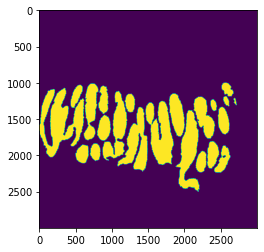

In [ ]:
plt.imshow(output/255)

In [ ]:
from collections import defaultdict

dice_before = defaultdict(list)
dice_after = defaultdict(list)
for i, row in tqdm(sub_df.sort_values(by='age').iterrows(), total=len(sub_df)):
    
    id = row['id']
    rle = row['rle']
    h, w = row['img_height'], row['img_width']
   
    img_full_res = cv2.cvtColor(cv2.imread(f"../data/hubmap_orig/train_images/{id}.tiff"), cv2.COLOR_BGR2RGB)
    img = cv2.cvtColor(cv2.imread(f"../data/hubmap_768_whole/train_images/{id}.png"), cv2.COLOR_BGR2RGB)
    mask_full_res = cv2.imread(f"../data/hubmap_orig/train_masks/{id}.png", cv2.IMREAD_GRAYSCALE)

    tiff = img #aug_img['image']
    tiff = tiff.astype(np.float32)/255
    H,W,_ = tiff.shape

    #or just resize to h,w = 768
    # img_size = 768
    # image = cv2.resize(tiff,dsize=(img_size, img_size),interpolation=cv2.INTER_LINEAR)

    image = img2tensor(tiff).cuda() #img2tensor(image)
    batch = {'image':image}

    model.eval()
    model.output_type = ['inference']

    use = 0
    probability = 0
    with torch.no_grad():
        with torch.cuda.amp.autocast(enabled = True):
            use += 1
            output = model(batch)
            probability += \
                F.interpolate(output['probability'], size=(img.shape[0], img.shape[1]),
                                mode='bilinear',align_corners=False, antialias=True )

    #---
    probability = probability.data.cpu().numpy()
    thresh = 0.1 if row['organ'] == 'lung' else 0.5
    p = probability > thresh 
    p = p[0][0]

    mask_pred = p.astype(np.uint8)
    mask_pred[mask_pred == 1] = 255
    mask_pred = cv2.resize(mask_pred, dsize=(mask_full_res.shape[0], mask_full_res.shape[1]), interpolation=cv2.INTER_LINEAR)

    mask_full_res[mask_full_res == 1] = 255
    output = refiner.refine(img_full_res, mask_pred, fast=True, L=768)


    output[output > 0] = 255
    #output[output <= 127] = 0

    dice_before_item = dice_np(mask_full_res, mask_pred, 255)
    dice_after_item = dice_np(mask_full_res, output, 255)

    print(id, ' ', row['organ'])
    print('Before:', dice_before_item)
    print('After:', dice_after_item)
    print(' ')
    dice_before[row['organ']].append(dice_before_item)
    dice_before['all'].append(dice_before_item)
    if row['organ'] in ('largeintestine', 'spleen'):
        dice_after[row['organ']].append(dice_after_item)
        dice_after['all'].append(dice_before_item)
    else:    
        dice_after[row['organ']].append(dice_after_item)
        dice_after['all'].append(dice_after_item)

  0%|          | 0/88 [00:00<?, ?it/s]

27803   spleen
Before: 0.8088445676942909
After: 0.8163965837803132
 
2793   lung
Before: 0.048177152899038136
After: 0.04248385454881975
 
30474   kidney
Before: 0.9323435738850293
After: 0.8567060707228997
 
24222   kidney
Before: 0.953204007524724
After: 0.9254830043476823
 
1229   prostate
Before: 0.9005933510647514
After: 0.8831154014851176
 
8227   prostate
Before: 0.9478111725745558
After: 0.907760505039673
 
18121   kidney
Before: 0.9600990703933018
After: 0.9655802560067852
 
32527   kidney
Before: 0.9607793727366091
After: 0.9371398119599559
 
6021   kidney
Before: 0.7161041077042254
After: 0.8127360826544187
 
16564   lung
Before: 0.1560055785953702
After: 0.14381849319883802
 
5832   largeintestine
Before: 0.9050687169407058
After: 0.8312882735707037
 
5317   prostate
Before: 0.89068303471621
After: 0.8951937920371368
 
2174   prostate
Before: 0.9391715642081114
After: 0.9450900601644658
 
16609   prostate
Before: 0.3677665990067273
After: 0.3490470429130391
 
8638   prosta

In [ ]:
np.mean(dice_before['all']), \
np.mean(dice_after['all'])

(0.7841965421188433, 0.7735419564464991)

In [ ]:
mean_dice_before = {}
mean_dice_after = {}
for organ in dice_before.keys():
    dice_vals_before = dice_before[organ]
    dice_vals_after = dice_after[organ]
    print(f'{organ} before: {np.mean(dice_vals_before)} after: {np.mean(dice_vals_after)}')
    mean_dice_before[organ] = np.mean(dice_vals_before)
    mean_dice_after[organ] = np.mean(dice_vals_after)

spleen before: 0.8415294173224086 after: 0.8228286271580052
all before: 0.7841965421188433 after: 0.7735419564464991
lung before: 0.26898148007762496 after: 0.23665939423105806
kidney before: 0.9172601530460051 after: 0.9114463392949794
prostate before: 0.8150351710993892 after: 0.7974528595675707
largeintestine before: 0.8776215172599543 after: 0.8380919143871975


In [ ]:
mask_pred.dtype

dtype('uint8')

In [ ]:
np.unique(output)

array([  0, 255], dtype=uint8)

In [ ]:
probability.flatten().shape

(589824,)

In [ ]:
mask_pred.flatten().shape

(9000000,)

In [ ]:
np.mean(dice_before), \
np.mean(dice_after)

(0.7841965421188433, 0.7866247476077137)

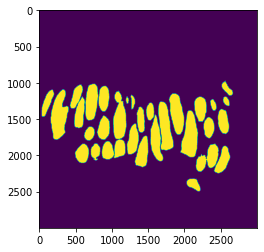

In [ ]:
plt.imshow(mask_full_res)

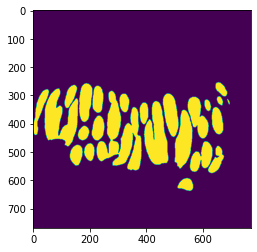

In [ ]:
plt.imshow(p)

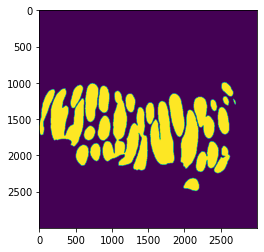

In [ ]:
plt.imshow(mask_pred)

### Lung Preds Viz

In [ ]:
sub_df = df.iloc[val]

In [ ]:
sub_df = sub_df[sub_df['organ'] == 'prostate']

In [ ]:
aug = test_time_stnorm(stain='pas')

In [ ]:
aug_image = aug(image=img)

TypeError: __call__() missing 1 required positional argument: 'mask'

  0%|          | 0/23 [00:00<?, ?it/s]

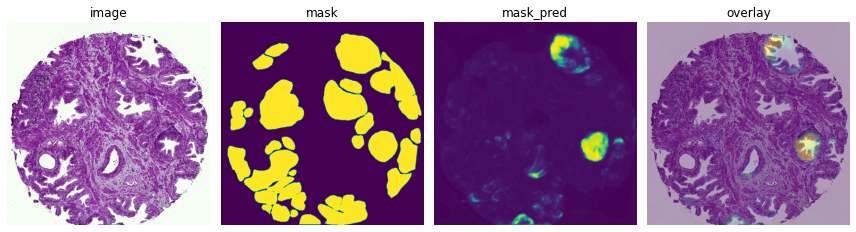

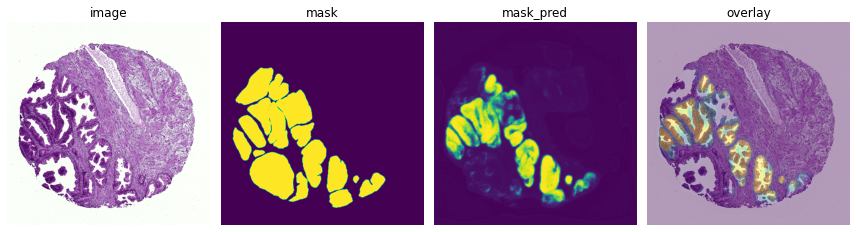

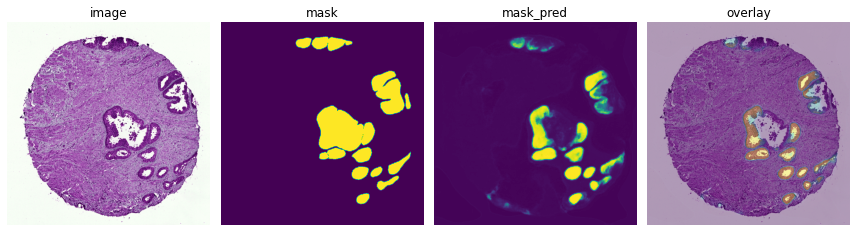

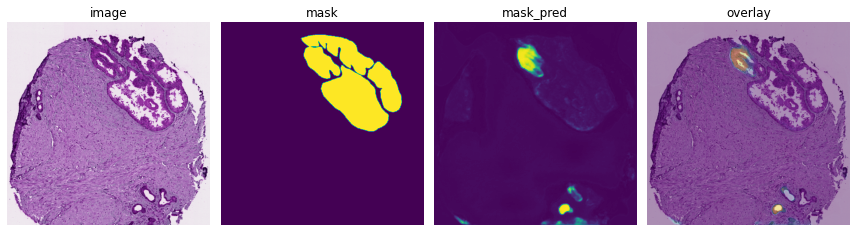

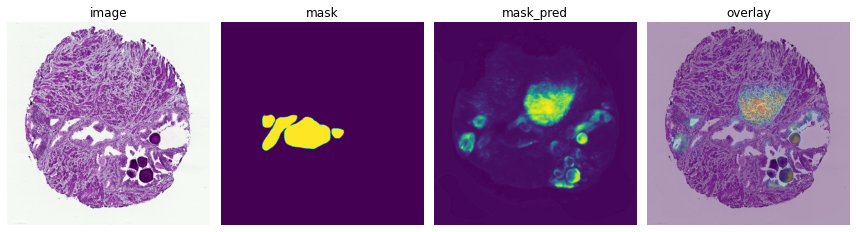

...

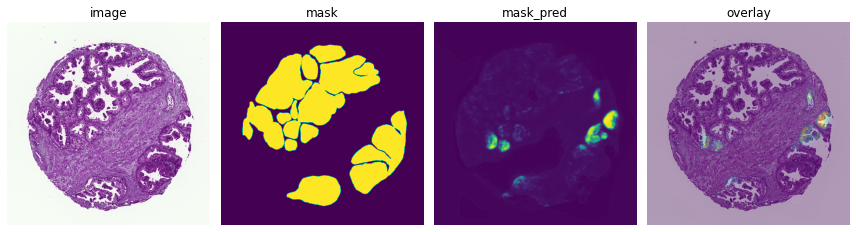

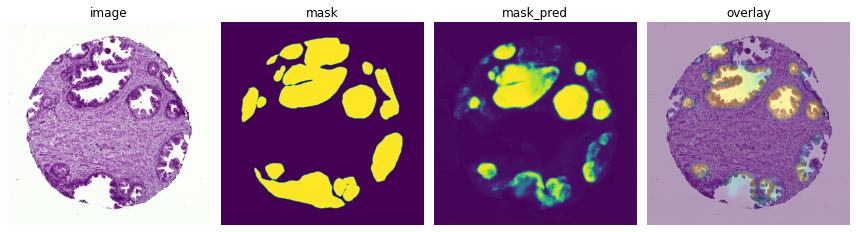

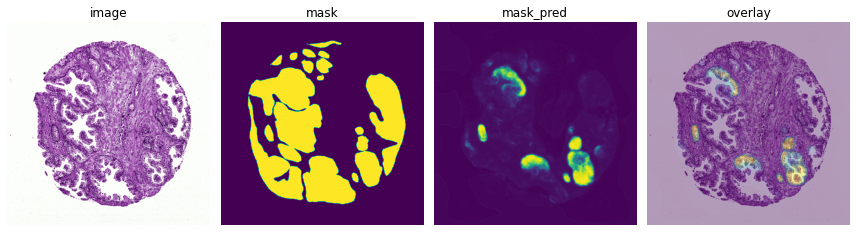

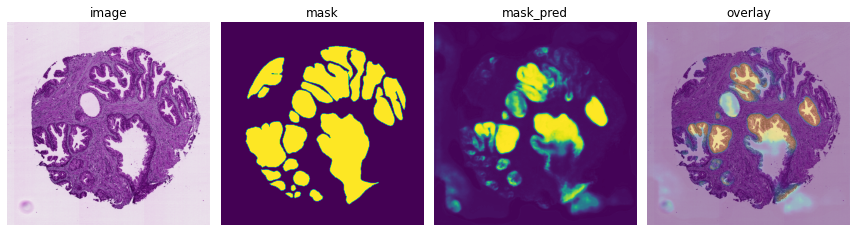

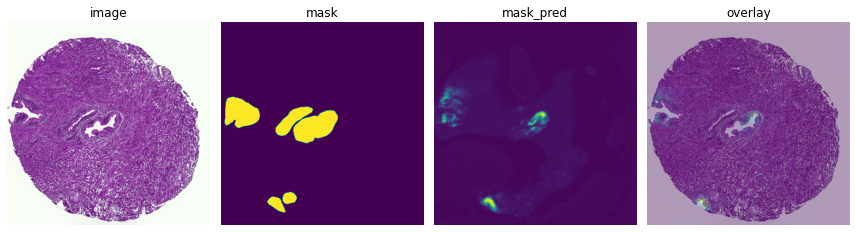

In [ ]:
for i, row in tqdm(sub_df.sort_values(by='age').iterrows(), total=len(sub_df)):
    
    id = row['id']
    rle = row['rle']
    h, w = row['img_height'], row['img_width']
   
    img_full_res = cv2.cvtColor(cv2.imread(f"../data/HUBMAP_HPA_22/hubmap_768_whole/train_images/{id}.png"), cv2.COLOR_BGR2RGB)
    img = cv2.cvtColor(cv2.imread(f"../data/HUBMAP_HPA_22/hubmap_768_whole/train_images/{id}.png"), cv2.COLOR_BGR2RGB)
    mask = cv2.imread(f"../data/HUBMAP_HPA_22/hubmap_768_whole/train_masks/{id}.png", cv2.IMREAD_GRAYSCALE)

    img = aug(image=img, mask=mask)['image']

    tiff = img
    tiff = tiff.astype(np.float32)/255
    H,W,_ = tiff.shape

    # or just resize to h,w = 768
    # img_size = 768
    # image = cv2.resize(tiff,dsize=(img_size, img_size),interpolation=cv2.INTER_LINEAR)

    image = img2tensor(tiff).cuda() #img2tensor(image)
    batch = {'image':image}

    model.eval()
    model.output_type = ['inference']

    use = 0
    probability = 0
    with torch.no_grad():
        with torch.cuda.amp.autocast(enabled = True):
            use += 1
            output = model(batch)
            probability += \
                F.interpolate(output['probability'], size=(img.shape[0], img.shape[1]),
                                mode='bilinear',align_corners=False, antialias=True )

    #---
    #dice = metric(probability, mask_to_tensor(mask).cuda())
    probability = probability.data.cpu().numpy()
    p = probability > 0.5 

    

    m = img
    p = probability[0][0]
    #print('Dice', dice)
    plt.figure(figsize=(12, 7))
    plt.subplot(1, 4, 1); plt.imshow(m); plt.axis('OFF'); plt.title('image')
    plt.subplot(1, 4, 2); plt.imshow(mask*255); plt.axis('OFF'); plt.title('mask')
    plt.subplot(1, 4, 3); plt.imshow(p*255); plt.axis('OFF'); plt.title('mask_pred')
    plt.subplot(1, 4, 4); plt.imshow(m); plt.imshow(p*255, alpha=0.4); plt.axis('OFF'); plt.title('overlay')
    plt.tight_layout()
    plt.show()